<a href="https://colab.research.google.com/github/Tendo15/MscDataObservations/blob/Heathrow/Weather_Observations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from dataprep.eda import plot, plot_missing, plot_correlation, create_report

In [ ]:
!pip install dataprep
!pip install plotly.express

  Using cached plotly_express-0.4.1-py2.py3-none-any.whl (2.9 kB)


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# 1. EXPLORATORY DATA ANALYSIS

In [ ]:
import pandas as pd

dataset = pd.read_csv('/content/drive/MyDrive/ColabNotebooks2024/Disso24/flight_data.csv')
dataset.head()
print(dataset.shape)

(10000, 9)


# Dataset details


In [ ]:
dataset.shape

(10000, 9)

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Flight_ID            10000 non-null  int64 
 1   Date                 10000 non-null  object
 2   Time                 10000 non-null  object
 3   Departure_Airport    10000 non-null  object
 4   Arrival_Airport      10000 non-null  object
 5   Temperature_Celsius  10000 non-null  int64 
 6   Wind_Speed_knots     10000 non-null  int64 
 7   Turbulence_Level     10000 non-null  object
 8   Visibility_km        10000 non-null  object
dtypes: int64(3), object(6)
memory usage: 703.2+ KB


In [ ]:
dataset.describe()

,Flight_ID,Temperature_Celsius,Wind_Speed_knots
count,10000.000000,10000.000000,10000.000000
mean,100.685700,10.314800,24.906100
std,57.392387,17.594467,14.812286
min,1.000000,-20.000000,0.000000
25%,50.000000,-5.000000,12.000000
50%,102.000000,11.000000,25.000000
75%,150.000000,25.000000,38.000000
max,200.000000,40.000000,50.000000


# Column Types

In [ ]:
data_types = dataset.dtypes.to_dict()

for col_name, col_type in data_types.items():
    print(f'Column {col_name}:  {col_type}')

Column Flight_ID:  int64
Column Date:  object
Column Time:  object
Column Departure_Airport:  object
Column Arrival_Airport:  object
Column Temperature_Celsius:  int64
Column Wind_Speed_knots:  int64
Column Turbulence_Level:  object
Column Visibility_km:  object


In [ ]:
print(f'Number of integer columns: {dataset.select_dtypes(include="int").shape[1]}')
print(f'Number of object(categorical) columns: {dataset.select_dtypes(include="object").shape[1]}')
print(f'Total number of columns: {dataset.shape[1]}')

Number of integer columns: 3
Number of object(categorical) columns: 6
Total number of columns: 9


# Duplicate Values

In [ ]:
dataset.duplicated().sum()

0

# Missing values


In [ ]:
print('Total number of missing values =', dataset.isna().sum().sum())
print("""""")
vars_with_missing = []
for feature in dataset.columns:
    missings = dataset[feature].isna().sum()

    if missings > 0 :
        vars_with_missing.append(feature)
        missings_perc = missings / dataset.shape[0]
        print('Feature {} has {} records ({:.2%}) with missing values.'.format(feature, missings, missings_perc))
print('In total, there are {} features with missing values'.format(len(vars_with_missing)))

Total number of missing values = 0

In total, there are 0 features with missing values


In [ ]:
px.bar(dataset.isna().sum()/len(dataset)*100, title='Percentage of missing values per column').update_layout(xaxis_title='Column', yaxis_title='Percentage of missing values', showlegend=False, title_x=0.5)

# Raw data Correlation

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlation(dataset, config={'height':1300, 'width':1600}):
    # Extracting height and width from the config dictionary
    height = config.get('height', 1300)
    width = config.get('width', 1600)

    # Using Seaborn to create a correlation plot
    corr = dataset.corr()
    plt.figure(figsize=(width/100, height/100))
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Correlation Plot')
    plt.show()

# Example usage:
# Assuming dataset is a pandas DataFrame containing numerical data
# and config is a dictionary with height and width specified
# plot_correlation(dataset, config={'height': 1300, 'width': 1600})


**Multivariate analysis**


/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:7084: FutureWarning:

Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:7084: FutureWarning:

Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.




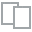
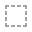
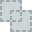
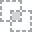
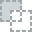
...
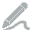
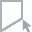
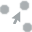
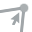
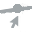

In [ ]:
plot(dataset, 'Wind_Speed_knots', 'Time')

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:7084: FutureWarning:

Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:7084: FutureWarning:

Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.




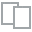
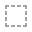
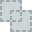
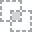
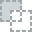
...
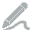
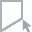
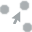
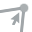
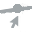

In [ ]:
plot(dataset, 'Turbulence_Level','Wind_Speed_knots')

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:7084: FutureWarning:

Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.

/usr/local/lib/python3.10/dist-packages/dask/dataframe/core.py:7084: FutureWarning:

Meta is not valid, `map_partitions` and `map_overlap` expects output to be a pandas object. Try passing a pandas object as meta or a dict or tuple representing the (name, dtype) of the columns. In the future the meta you passed will not work.




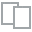
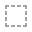
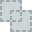
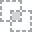
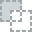
...
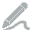
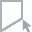
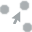
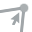
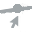

In [ ]:
plot(dataset, 'Turbulence_Level','Temperature_Celsius')

In [ ]:
dataset.head()

,Flight_ID,Date,Time,Departure_Airport,Arrival_Airport,Temperature_Celsius,Wind_Speed_knots,Turbulence_Level,Visibility_km
0,142,2024-10-11,10:25,ATL Airport,SEA Airport,35,45,High,19
1,110,2024-01-20,18:38,IAH Airport,AUS Airport,3,25,Low,6
2,113,2024-12-26,12:50,STL Airport,SEA Airport,20,48,Medium,6
3,3,2024-08-19,07:28,MCO Airport,LAS Airport,33,48,High,18
4,22,2024-12-07,07:10,LAX Airport,SEA Airport,28,34,Low,20


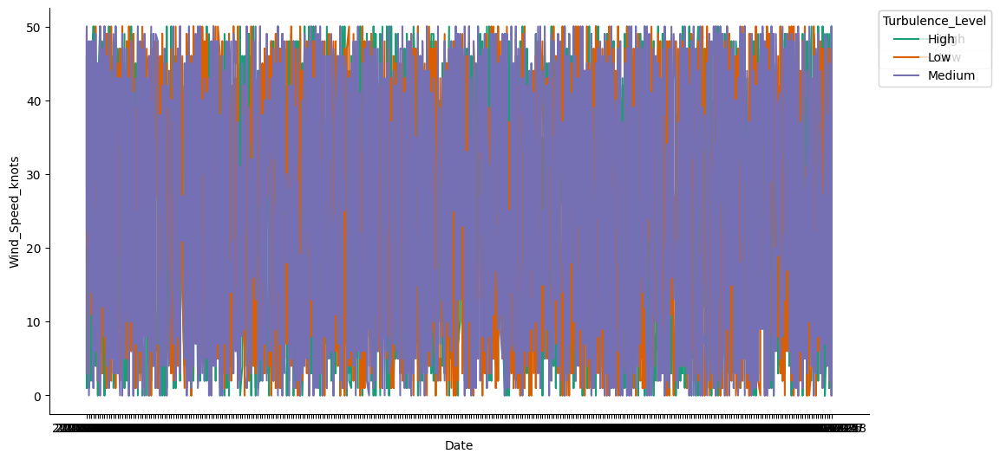

In [ ]:
# @title Date vs Wind_Speed_knots

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Wind_Speed_knots']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = dataset.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Turbulence_Level')):
  _plot_series(series, series_name, i)
  fig.legend(title='Turbulence_Level', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Wind_Speed_knots')

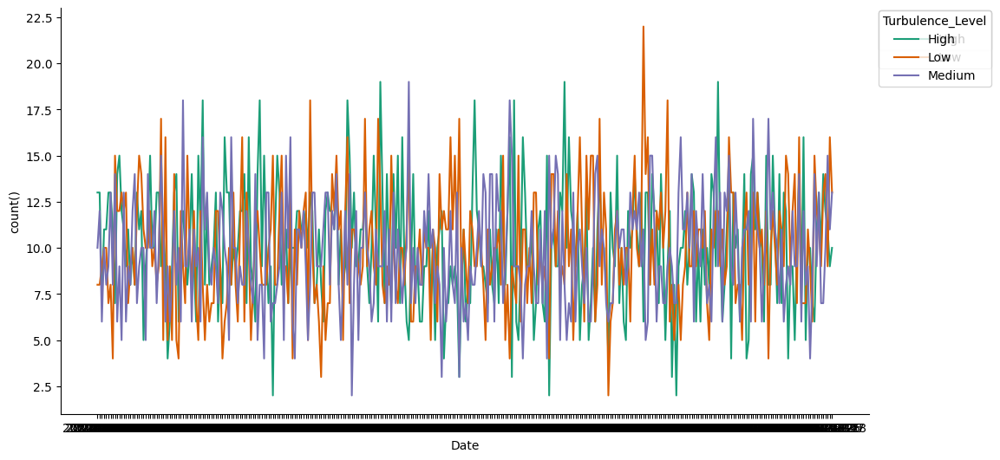

In [ ]:
# @title Date vs count()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Date']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Date'}, axis=1)
              .sort_values('Date', ascending=True))
  xs = counted['Date']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = dataset.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Turbulence_Level')):
  _plot_series(series, series_name, i)
  fig.legend(title='Turbulence_Level', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('count()')

<ipython-input-32-68bb95f69913>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




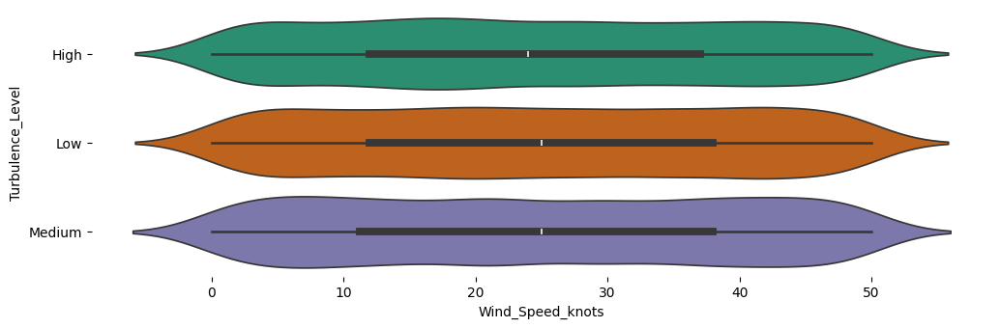

In [ ]:
# @title Turbulence_Level vs Wind_Speed_knots

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(dataset['Turbulence_Level'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(dataset, x='Wind_Speed_knots', y='Turbulence_Level', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<ipython-input-33-112d0829b025>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




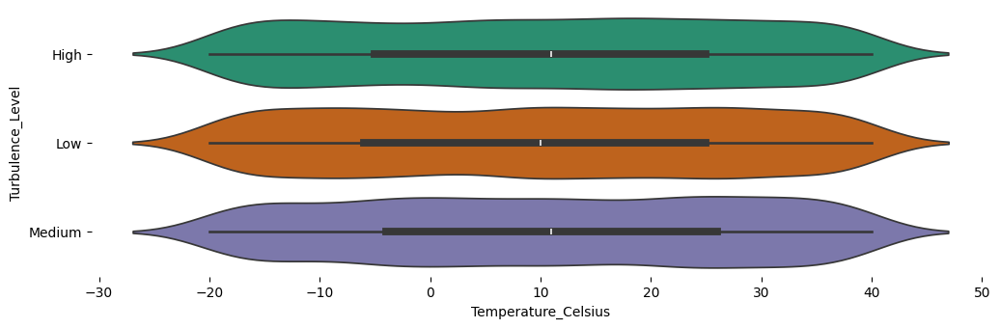

In [ ]:
# @title Turbulence_Level vs Temperature_Celsius

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(dataset['Turbulence_Level'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(dataset, x='Temperature_Celsius', y='Turbulence_Level', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

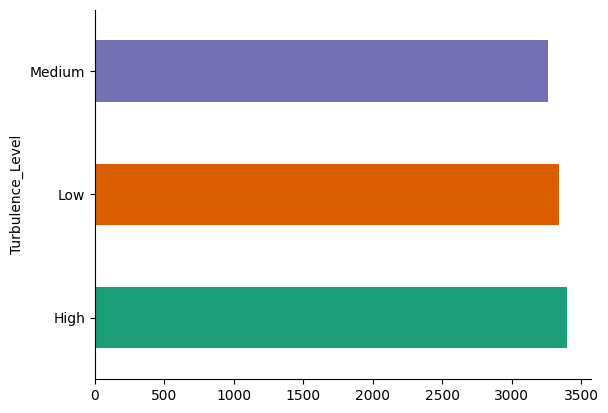

In [ ]:
# @title Turbulence_Level

from matplotlib import pyplot as plt
import seaborn as sns
dataset.groupby('Turbulence_Level').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

**Histograms**

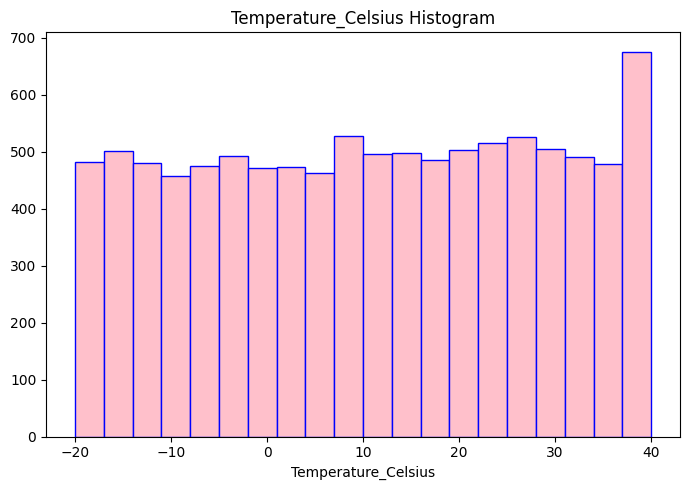

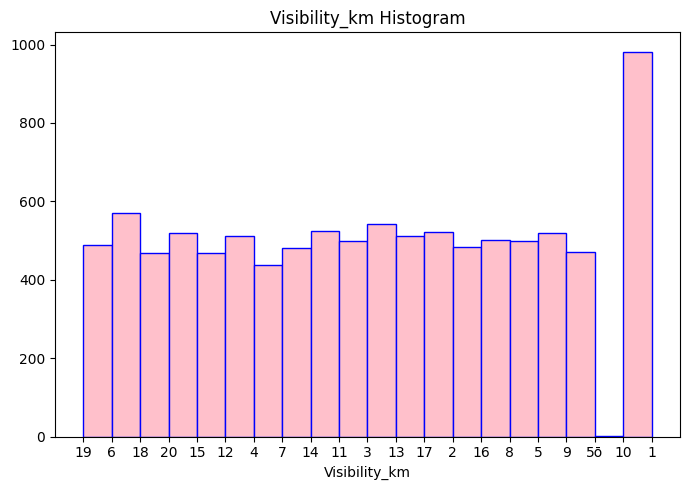

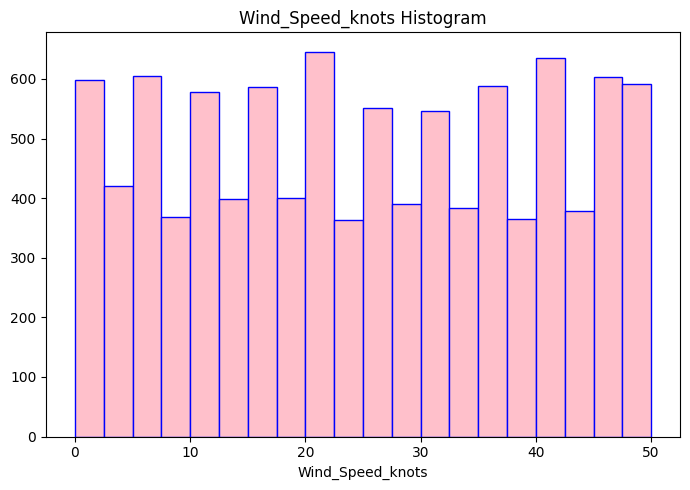

In [ ]:
cols = ['Temperature_Celsius' ,'Visibility_km','Wind_Speed_knots']

for i in cols:
    plt.figure(figsize=(7,5))
    plt.hist(dataset[i], bins=20, color='pink', edgecolor='blue')
    plt.xlabel(f'{i}')
    plt.title(f'{i} Histogram')
    plt.tight_layout()
    plt.show()

CONVERSION: categorical to Numeric data

*   Categorical to Numeric data
*   Int to Float



In [ ]:
#convert Temp and Wind into floats from in

#state the specific variable you want to convert
cols=['Temperature_Celsius','Wind_Speed_knots']

#convert the columns by using the .astype() funstion, naming the specific datatypes
for column in cols:
  dataset[column] =dataset[column].astype(float)

In [ ]:
#Converting the categorical turbulences into numeric

#Dropping 'Flight ID' column
def data_trans(dataset):
    dataset = dataset.drop(columns =['Flight_ID'])
    dataset = dataset.dropna()

#Transforming turbulance level
#High -> 2, Low -> 1, Mid -> 0

    def labeling(value):
          if value == "High" :
             return 2
          elif value == "Medium" :
             return 1
          else:
             return 0

          return None

    dataset['Level'] = dataset['Turbulence_Level'].apply(labeling)
    dataset = dataset.drop(columns =['Turbulence_Level'])
    dataset = dataset.astype({'Level':'int64'})

    return dataset

train = data_trans(dataset.copy())
train.head()


,Date,Time,Departure_Airport,Arrival_Airport,Temperature_Celsius,Wind_Speed_knots,Visibility_km,Level
0,2024-10-11,10:25,ATL Airport,SEA Airport,35.0,45.0,19,2
1,2024-01-20,18:38,IAH Airport,AUS Airport,3.0,25.0,6,0
2,2024-12-26,12:50,STL Airport,SEA Airport,20.0,48.0,6,1
3,2024-08-19,07:28,MCO Airport,LAS Airport,33.0,48.0,18,2
4,2024-12-07,07:10,LAX Airport,SEA Airport,28.0,34.0,20,0


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Date                 10000 non-null  object 
 1   Time                 10000 non-null  object 
 2   Departure_Airport    10000 non-null  object 
 3   Arrival_Airport      10000 non-null  object 
 4   Temperature_Celsius  10000 non-null  float64
 5   Wind_Speed_knots     10000 non-null  float64
 6   Visibility_km        10000 non-null  object 
 7   Level                10000 non-null  int64  
dtypes: float64(2), int64(1), object(5)
memory usage: 625.1+ KB


<ipython-input-23-61c486523ec9>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




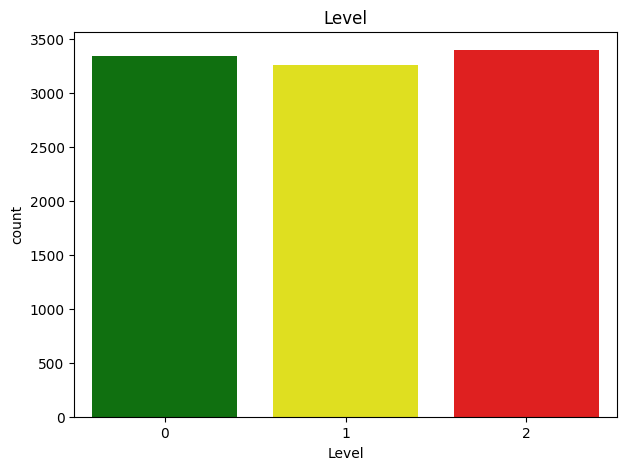

2    3400
0    3342
1    3258
Name: Level, dtype: int64


In [ ]:
plt.figure(figsize=(7,5))
sns.countplot(data=train , x='Level', palette=['green','yellow', 'red'])
plt.title('Level')
plt.show()

print(train['Level'].value_counts())


In [ ]:
print(train['Date'])

0       2024-10-11
1       2024-01-20
2       2024-12-26
3       2024-08-19
4       2024-12-07
           ...    
9995    2024-10-17
9996    2024-11-16
9997    2024-07-23
9998    2024-05-19
9999    2024-10-26
Name: Date, Length: 10000, dtype: object


In [ ]:
print(train['Date'])
print(train['Wind_Speed_knots'])

0       2024-10-11
1       2024-01-20
2       2024-12-26
3       2024-08-19
4       2024-12-07
           ...    
9995    2024-10-17
9996    2024-11-16
9997    2024-07-23
9998    2024-05-19
9999    2024-10-26
Name: Date, Length: 10000, dtype: object
0       45.0
1       25.0
2       48.0
3       48.0
4       34.0
        ... 
9995    17.0
9996     6.0
9997    22.0
9998     2.0
9999    34.0
Name: Wind_Speed_knots, Length: 10000, dtype: float64


# TIME SERIES ANALYSIS OF WIND SPEED PER SEASON

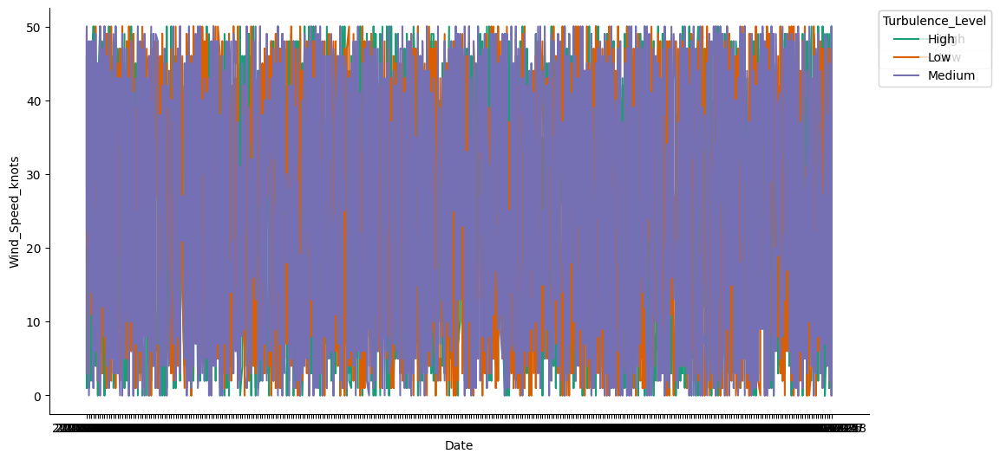

In [ ]:
# @title Date vs Wind_Speed_knots

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Wind_Speed_knots']

  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = dataset.sort_values('Date', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Turbulence_Level')):
  _plot_series(series, series_name, i)
  fig.legend(title='Turbulence_Level', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Wind_Speed_knots')

# WIND VS TIME

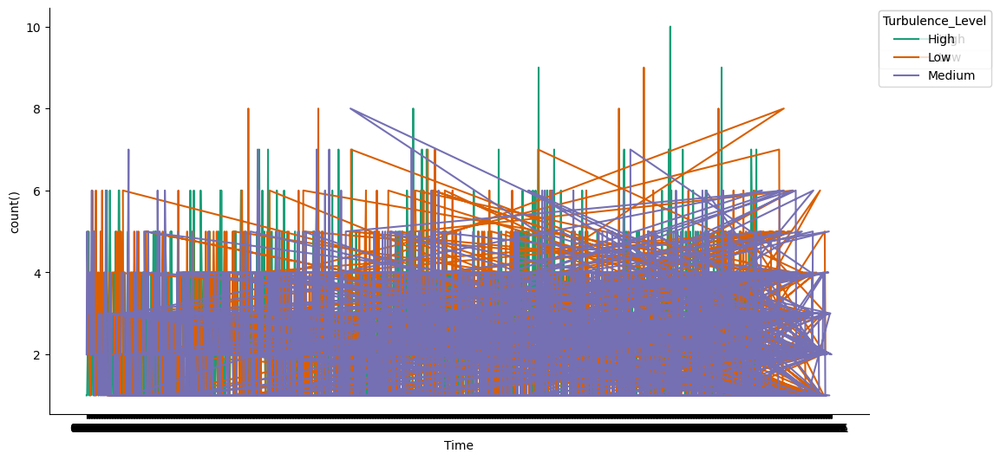

In [ ]:
# @title Date vs count()

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Time']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Time'}, axis=1)
              .sort_values('Time', ascending=True))
  xs = counted['Time']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = dataset.sort_values('Time', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Turbulence_Level')):
  _plot_series(series, series_name, i)
  fig.legend(title='Turbulence_Level', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Time')
_ = plt.ylabel('count()')

NUMERIC VALUE CONVERSION
*   'pd.to_numeric()'
*   Turbulence_level
*   Wind_speed_knots







In [ ]:
df = pd.DataFrame(dataset)


columns_to_convert = ['Date', 'Time', 'Departure_Airport', 'Arrival_Airport','Temperature_Celsius','Wind_Speed_knots', 'Turbulence_Level', 'Visibility_km']

# Convert columns to numeric
for column in columns_to_convert:
    df[column] = pd.to_numeric(df[column], errors='coerce')

print(df.dtypes)
print(df)

Flight_ID                int64
Date                   float64
Time                   float64
Departure_Airport      float64
Arrival_Airport        float64
Temperature_Celsius      int64
Wind_Speed_knots         int64
Turbulence_Level       float64
Visibility_km          float64
dtype: object
      Flight_ID  Date  Time  ...  Wind_Speed_knots  Turbulence_Level  Visibility_km
0           142   NaN   NaN  ...                45               NaN           19.0
1           110   NaN   NaN  ...                25               NaN            6.0
2           113   NaN   NaN  ...                48               NaN            6.0
3             3   NaN   NaN  ...                48               NaN           18.0
4            22   NaN   NaN  ...                34               NaN           20.0
...         ...   ...   ...  ...               ...               ...            ...
9995        113   NaN   NaN  ...                17               NaN            2.0
9996        128   NaN   NaN  ...   

In [ ]:
df.head()

,Flight_ID,Date,Time,Departure_Airport,Arrival_Airport,Temperature_Celsius,Wind_Speed_knots,Turbulence_Level,Visibility_km
0,142,NaN,NaN,NaN,NaN,35,45,NaN,19.0
1,110,NaN,NaN,NaN,NaN,3,25,NaN,6.0
2,113,NaN,NaN,NaN,NaN,20,48,NaN,6.0
3,3,NaN,NaN,NaN,NaN,33,48,NaN,18.0
4,22,NaN,NaN,NaN,NaN,28,34,NaN,20.0


In [ ]:
dataset.head()

,Flight_ID,Date,Time,Departure_Airport,Arrival_Airport,Temperature_Celsius,Wind_Speed_knots,Turbulence_Level,Visibility_km
0,142,NaN,NaN,NaN,NaN,35,45,NaN,19.0
1,110,NaN,NaN,NaN,NaN,3,25,NaN,6.0
2,113,NaN,NaN,NaN,NaN,20,48,NaN,6.0
3,3,NaN,NaN,NaN,NaN,33,48,NaN,18.0
4,22,NaN,NaN,NaN,NaN,28,34,NaN,20.0


from matplotlib import pyplot as plt
_df_0['Flight_ID'].plot(kind='hist', bins=20, title='Flight_ID')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Temperature_Celsius'].plot(kind='hist', bins=20, title='Temperature_Celsius')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Wind_Speed_knots'].plot(kind='hist', bins=20, title='Wind_Speed_knots')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['Visibility_km'].plot(kind='hist', bins=20, title='Visibility_km')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='Flight_ID', y='Temperature_Celsius', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Temperature_Celsius', y='Wind_Speed_knots', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='Wind_Speed_knots', y='Visibility_km', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Flight_ID']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_7.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Flight_ID')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Temperature_Celsius']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Temperature_Celsius')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Wind_Speed_knots']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Wind_Speed_knots')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['Date']
  ys = series['Visibility_km']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('Date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Date')
_ = plt.ylabel('Visibility_km')

from matplotlib import pyplot as plt
_df_11['Flight_ID'].plot(kind='line', figsize=(8, 4), title='Flight_ID')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_12['Temperature_Celsius'].plot(kind='line', figsize=(8, 4), title='Temperature_Celsius')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['Wind_Speed_knots'].plot(kind='line', figsize=(8, 4), title='Wind_Speed_knots')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['Visibility_km'].plot(kind='line', figsize=(8, 4), title='Visibility_km')
plt.gca().spines[['top', 'right']].set_visible(False)

**Univariate analysis**

**Multivariate analysis**

# 2. DATA PRE-PROCESSING

# Data split Train and Test